# Imports, data partition and pre-processing

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.discriminant_analysis import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler, PowerTransformer
from sklearn.cluster import AgglomerativeClustering, DBSCAN, HDBSCAN, OPTICS, SpectralClustering
from sklearn.mixture import GaussianMixture
from scipy.stats import uniform, poisson
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
import sklearn
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

In [2]:
import os
import sys
sys.path.append(os.path.abspath('../utils'))
from transformer_pipeline import drop_rows, get_features_transformer
from dimensionality_reduction_and_explanation_tools import *
from custom_preprocessors import IdentityTransformer
from metrics import *

In [3]:
data = pd.read_csv("../data/movie_statistic_dataset.csv")
df, val = train_test_split(data, test_size=0.2, random_state=14)
df = drop_rows(df) # you can run code with validation set by changing df to val in drop_rows() function

In [18]:
dim_red_funs = [get_nmf_plots,get_pca_plots,get_tsne_plots]

def assign_color(cluster):
    column = tmp1['cluster']
    palette = np.array(sns.color_palette("husl", len(np.unique(column))))
    if cluster == -1:
        return 'grey'
    else:
        r, g, b = palette[cluster]
        return '#{:02x}{:02x}{:02x}'.format(int(r*255), int(g*255), int(b*255))

# Hierarchcal clustering

In [19]:
AG_transformer = make_pipeline(get_features_transformer(PowerTransformer(method="box-cox"),
                                          PowerTransformer(method="box-cox"),
                                          StandardScaler(),
                                          StandardScaler()), MinMaxScaler())
AG_X = AG_transformer.fit_transform(df)

In [20]:
model = AgglomerativeClustering()

parameters = {
    "n_clusters": [None],
    "metric": ["minkowski", 'rogerstanimoto',  'cosine', 'euclidean', 'hamming', 'jaccard'],
    "linkage": ['ward', 'complete', 'average', 'single'],
    "distance_threshold": uniform(5,40).rvs(size=20)}

score = {
    "silhouette_score": silhouette,
    "calinski_harabasz_score": calinski_harabasz,
    "davies_bouldin_score": davies_bouldin}

In [15]:
#tester = RandomizedSearchCV(estimator=model,
#                            param_distributions= parameters,
#                            random_state=14, 
#                            scoring=score,
#                            refit='silhouette_score',
#                            n_iter=100,
#                            cv=2) 

tester = GridSearchCV(estimator=model, param_grid= parameters, scoring=score, refit='silhouette_score', cv=3)

In [16]:
random_result = tester.fit(AG_X)
print("Best: %f using %s" % (random_result.best_score_, random_result.best_params_))


Best: 0.155865 using {'distance_threshold': 16.998620717203266, 'linkage': 'ward', 'metric': 'euclidean', 'n_clusters': None}


In [21]:
model = AgglomerativeClustering(distance_threshold = 6.428281262810862, linkage = 'ward', metric = 'euclidean', n_clusters = None)
y = model.fit_predict(AG_X)
model.n_clusters_

54

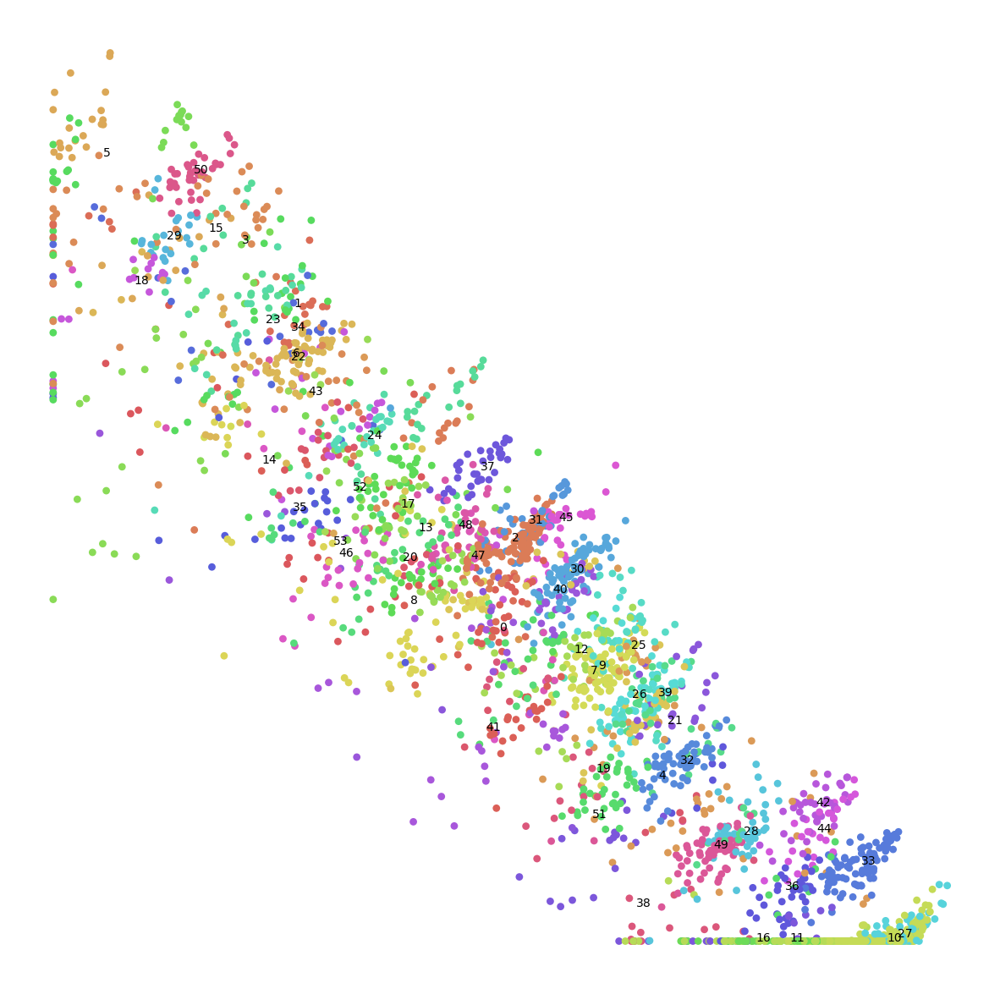

[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >The PCA reduction is performed on the [19] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


[scatterd] >INFO> Create scatterplot


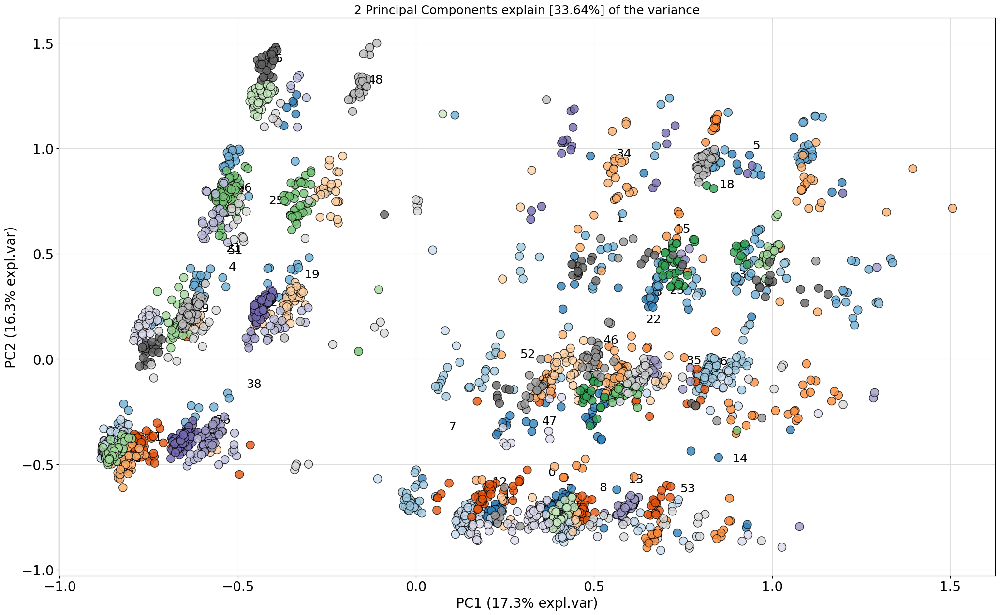

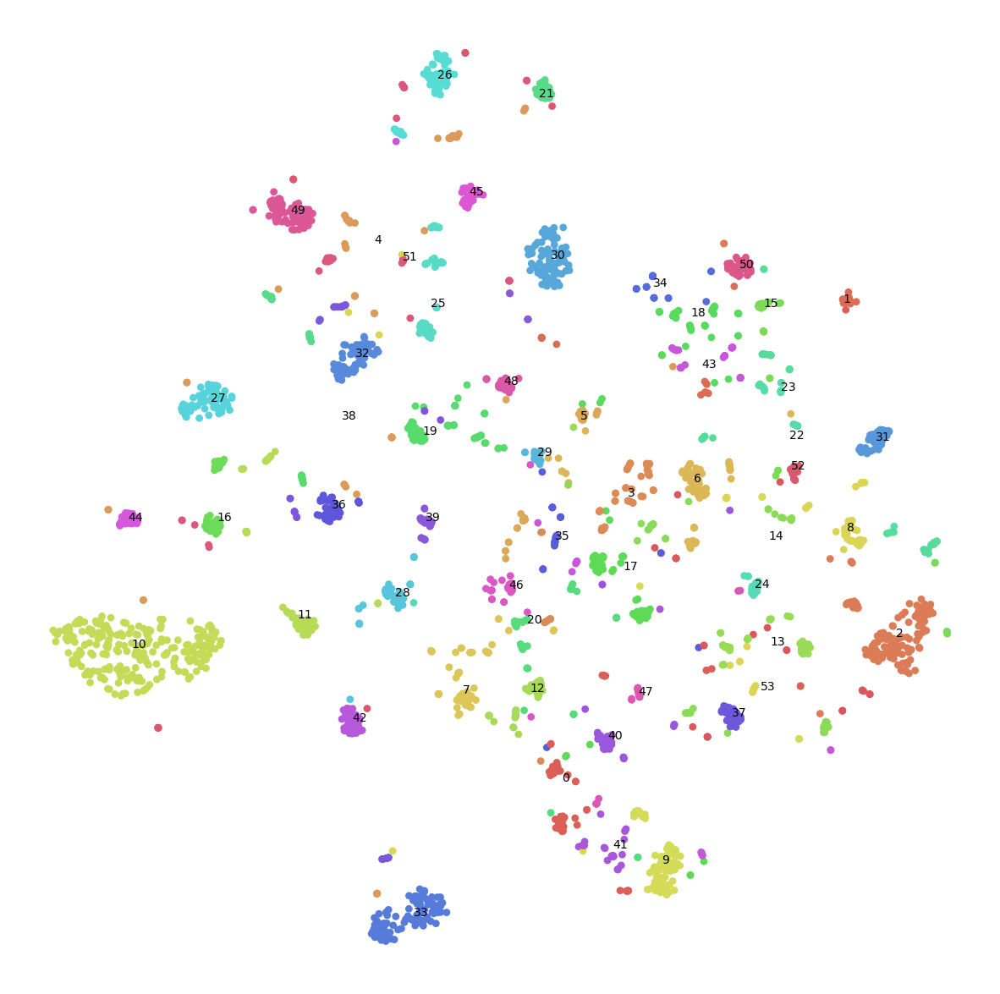

In [22]:
for fun in dim_red_funs:
    fun(AG_X,y)

In [23]:
AG_df = df.copy()
AG_df["cluster"] = y

print(f'number of films: {len(AG_df)}')
AG_df['cluster'].value_counts()

number of films: 2783


10    236
2     128
33     94
9      87
6      82
30     82
19     72
17     68
0      67
8      66
27     66
7      66
3      65
26     65
49     63
32     63
4      61
11     58
25     53
22     51
21     50
20     50
18     49
13     48
28     46
14     46
36     45
12     44
43     42
31     41
16     39
5      39
42     38
40     37
50     37
51     35
1      33
37     33
38     33
39     32
45     32
15     31
46     30
48     29
35     28
52     28
41     27
53     26
44     26
24     25
23     25
47     23
29     22
34     21
Name: cluster, dtype: int64

In [24]:
tmp1 = AG_df.copy()
tmp1['colour'] = tmp1['cluster'].apply(assign_color)
tmp1['colour'] = tmp1['colour'].astype(str)
tmp1 = tmp1.sort_values(by = "cluster")

html1 = tmp1.style.apply(lambda row: ['background-color: ' + row['colour']] * len(row), axis=1).to_html()
with open('AgglomerativeClustering.html', 'w') as f:
    f.write(html1)

# DBSCAN

In [6]:
DB_transformer = make_pipeline(get_features_transformer(PowerTransformer(method="box-cox"),
                                          PowerTransformer(method="box-cox"),
                                          IdentityTransformer(),
                                          IdentityTransformer()), MinMaxScaler())
DB_X = DB_transformer.fit_transform(df)
DB_X.shape

(2783, 19)

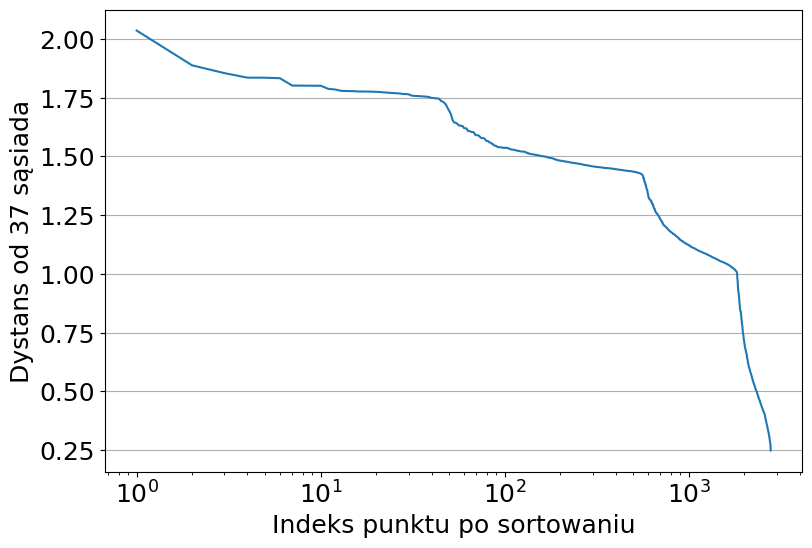

In [30]:
minPts = 38
nbrs = sklearn.neighbors.NearestNeighbors(n_neighbors=minPts).fit(DB_X)
distances, indices = nbrs.kneighbors(DB_X)
distanceDec = sorted(distances[:,minPts-1], reverse=True)
fig = plt.figure(figsize=(9,6))
ax1 = fig.add_subplot(111)

plt.xlabel('Indeks punktu po sortowaniu')
plt.ylabel('Dystans od 37 sąsiada')
ax1.plot(list(range(1,DB_X.shape[0]+1)), distanceDec)
plt.xscale('log')
plt.grid(axis='y')

plt.show()


In [40]:
model = DBSCAN()
parameters = {
    "eps": uniform(0.25,2.0),
    "min_samples": [minPts],
    "algorithm":['auto', 'ball_tree', 'kd_tree'],
    "metric":['euclidean','jaccard','dice']}


score = {
    "silhouette_score": silhouette,
    "calinski_harabasz_score": calinski_harabasz,
    "davies_bouldin_score": davies_bouldin}
    

In [42]:
tester = RandomizedSearchCV(estimator=model,
                            param_distributions= parameters,
                            random_state=14, 
                            scoring=score,
                            refit='silhouette_score',
                            n_iter=100,
                            cv=2) 

In [43]:
random_result = tester.fit(DB_X)
print("Best: %f using %s" % (random_result.best_score_, random_result.best_params_))

Best: 0.229953 using {'algorithm': 'ball_tree', 'eps': 1.7350227099870876, 'metric': 'euclidean', 'min_samples': 38}


In [7]:
model = DBSCAN(min_samples= 19, eps=0.05, algorithm = 'auto', metric = 'jaccard')
y = model.fit_predict(DB_X)
labels = model.labels_
# Number of clusters without a noise labeled as -1
len(set(labels)) - (1 if -1 in labels else 0)

32

[scatterd] >WARNING> posx and posy should be finite values
[scatterd] >WARNING> posx and posy should be finite values


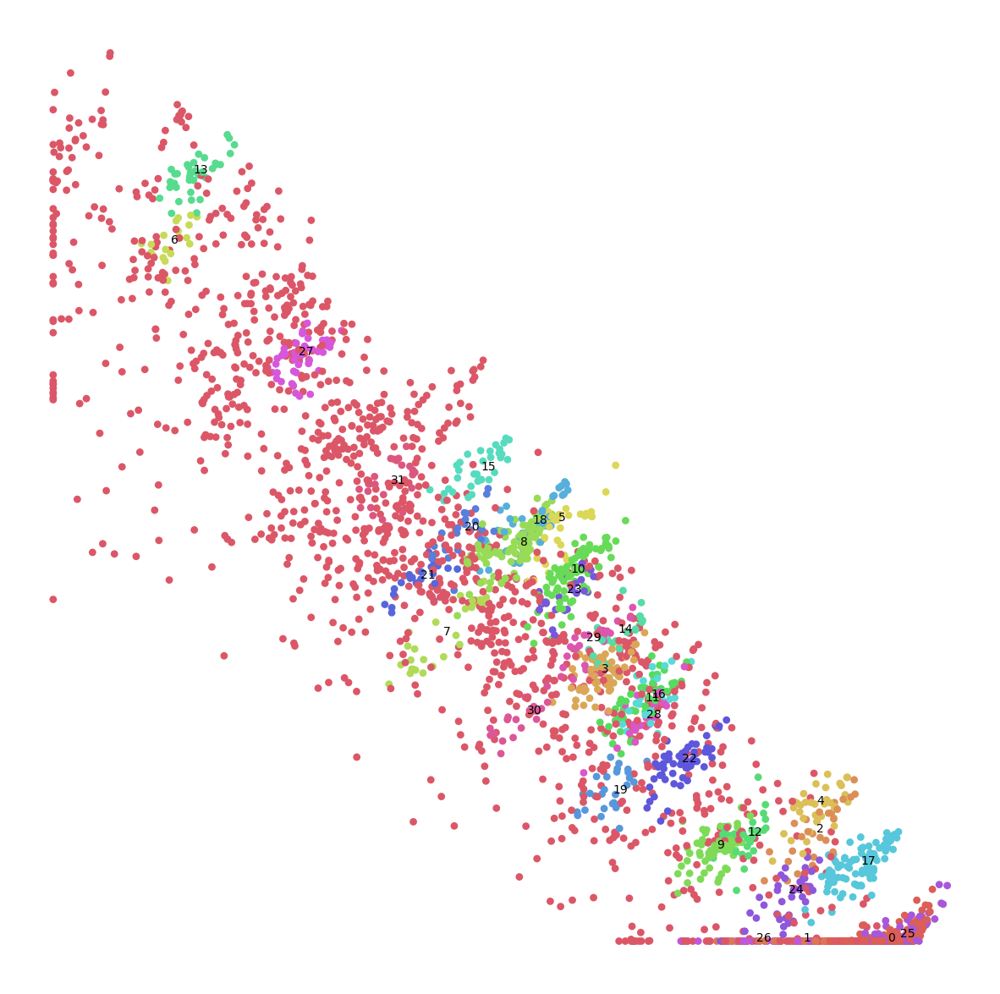

[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >The PCA reduction is performed on the [19] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


[scatterd] >INFO> Create scatterplot


[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


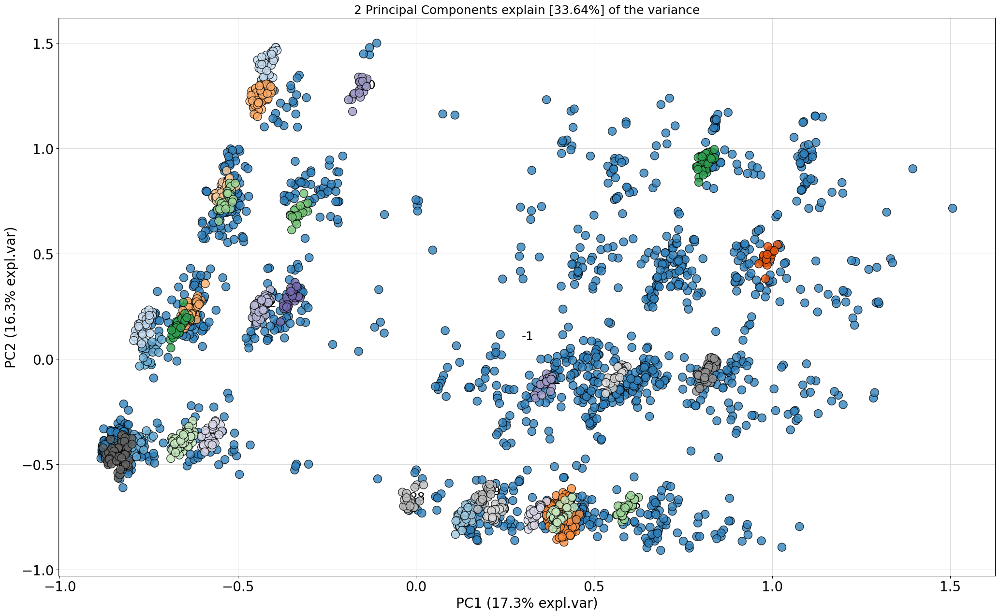

[scatterd] >WARNING> posx and posy should be finite values
[scatterd] >WARNING> posx and posy should be finite values


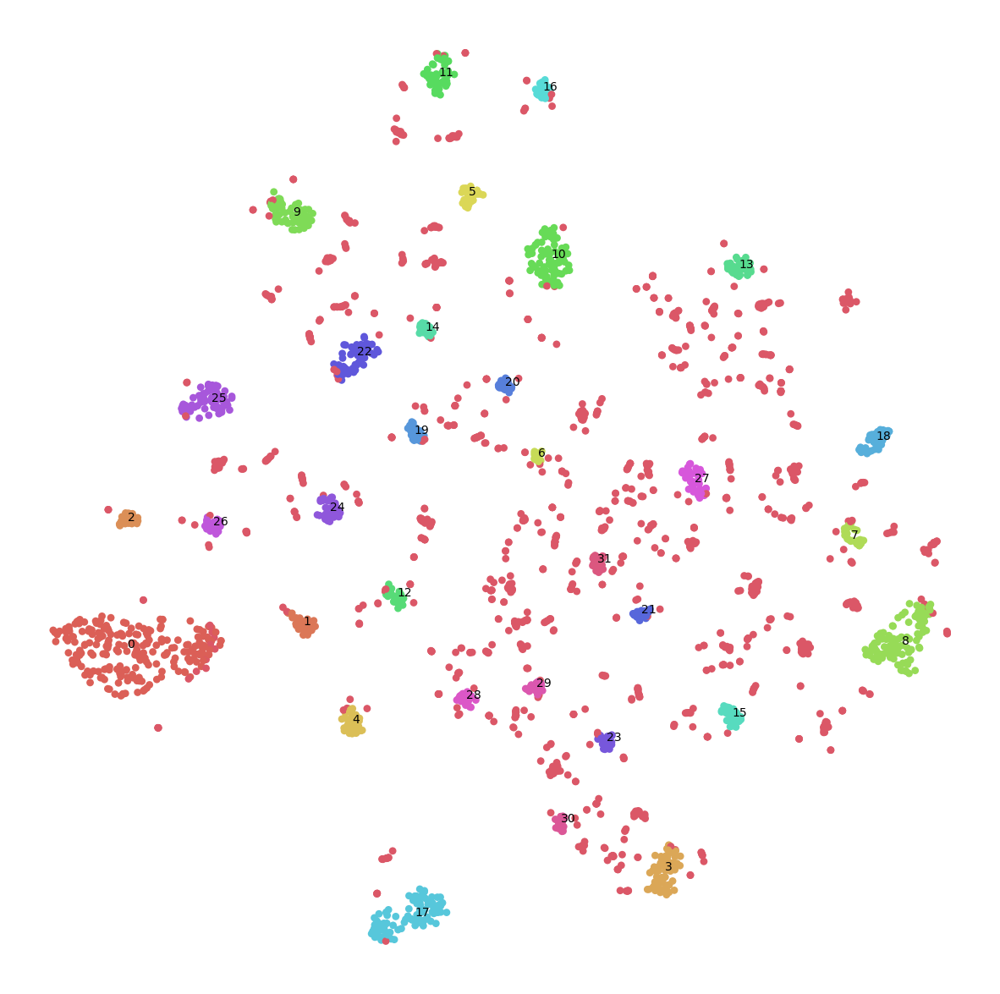

In [8]:
for fun in dim_red_funs:
    fun(DB_X,y)

In [9]:
DB_df = df.copy()
DB_df["cluster"] = y

print(f'number of films: {len(DB_df)}')
DB_df['cluster'].value_counts()

number of films: 2783


-1     1332
 0      227
 8      102
 17      93
 10      79
 25      63
 3       62
 22      58
 9       57
 11      51
 27      44
 18      40
 24      38
 13      37
 4       36
 1       35
 15      33
 5       32
 12      29
 7       29
 19      27
 16      26
 2       26
 28      25
 20      24
 23      24
 26      24
 29      23
 31      23
 14      22
 30      22
 21      21
 6       19
Name: cluster, dtype: int64

In [10]:
tmp1 = DB_df.copy()
tmp1['colour'] = tmp1['cluster'].apply(assign_color)

tmp1 = tmp1.sort_values(by = "cluster")

html1 = tmp1.style.apply(lambda row: ['background-color: ' + row['colour']] * len(row), axis=1).to_html()
with open('DBSCAN.html', 'w') as f:
    f.write(html1)

# HDBSCAN

In [11]:
HDB_transformer = make_pipeline(get_features_transformer(
    PowerTransformer(method="box-cox"),
    PowerTransformer(method="box-cox"),
    IdentityTransformer(),
    IdentityTransformer()
), MinMaxScaler())
HDB_X = HDB_transformer.fit_transform(df)

In [52]:
model = HDBSCAN()

parameters = {
    "min_cluster_size": [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20],
    "min_samples": [None, 1,2,3,4,5,6,7,8,9,10,12,13,14,15,16,17,18,19,20],
    # "cluster_selection_epsilon": uniform(0,5),
    "algorithm":['auto', 'balltree', 'kdtree', 'brute'],
    "metric":['euclidan','jaccard', 'dice']}

score = {
    "silhouette_score": silhouette,
    "calinski_harabasz_score": calinski_harabasz,
    "davies_bouldin_score": davies_bouldin,
    "min_distance": min_distance_between_clusters}

In [53]:
tester = RandomizedSearchCV(estimator=model,
                            param_distributions= parameters,
                            random_state=14, 
                            scoring=score,
                            refit='min_distance',
                            n_iter=100,
                            cv=2) 

In [54]:
random_result = tester.fit(HDB_X)
print("Best: %f using %s" % (random_result.best_score_, random_result.best_params_))

Best: 0.146259 using {'min_samples': 4, 'min_cluster_size': 19, 'metric': 'jaccard', 'algorithm': 'balltree'}


In [12]:
model = HDBSCAN(min_samples = 4, min_cluster_size= 10, metric='jaccard',)
y = model.fit_predict(HDB_X)
labels = model.labels_
len(set(labels)) - (1 if -1 in labels else 0)

69

[scatterd] >WARNING> posx and posy should be finite values
[scatterd] >WARNING> posx and posy should be finite values


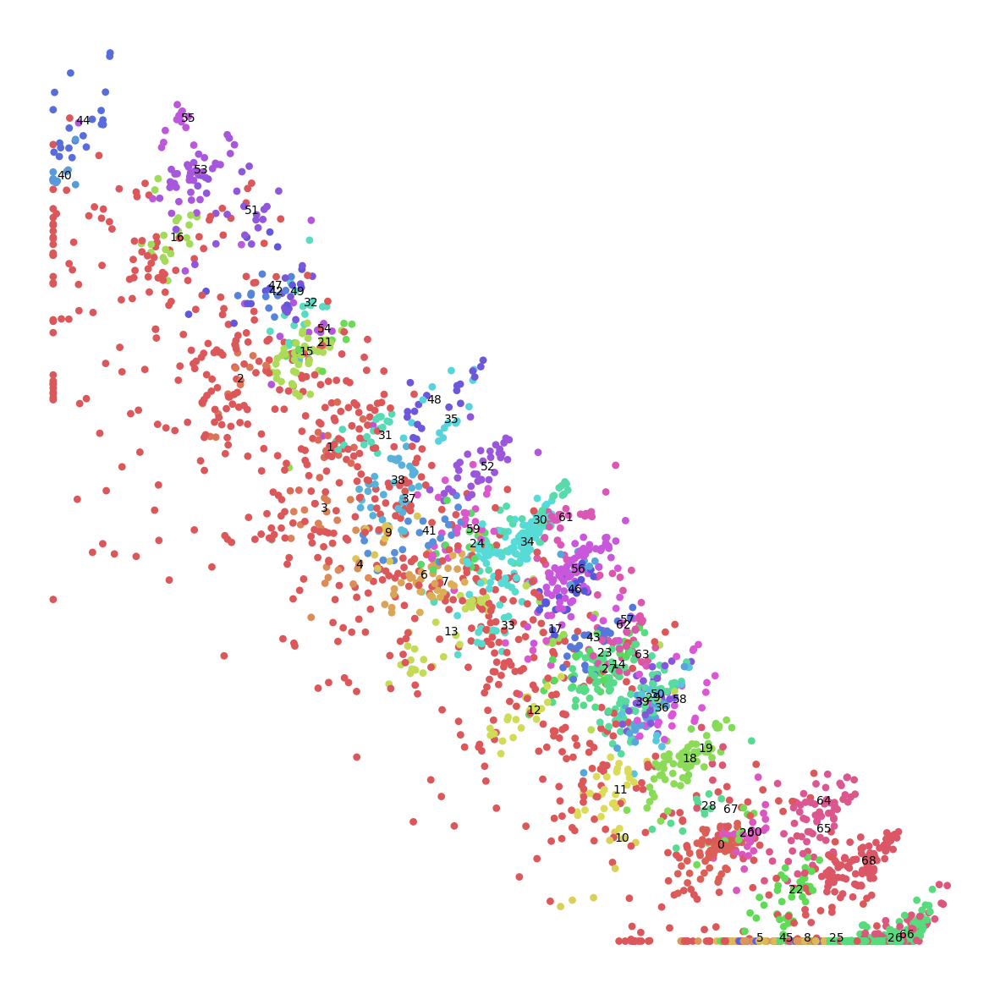

[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >The PCA reduction is performed on the [19] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


[scatterd] >INFO> Create scatterplot


[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


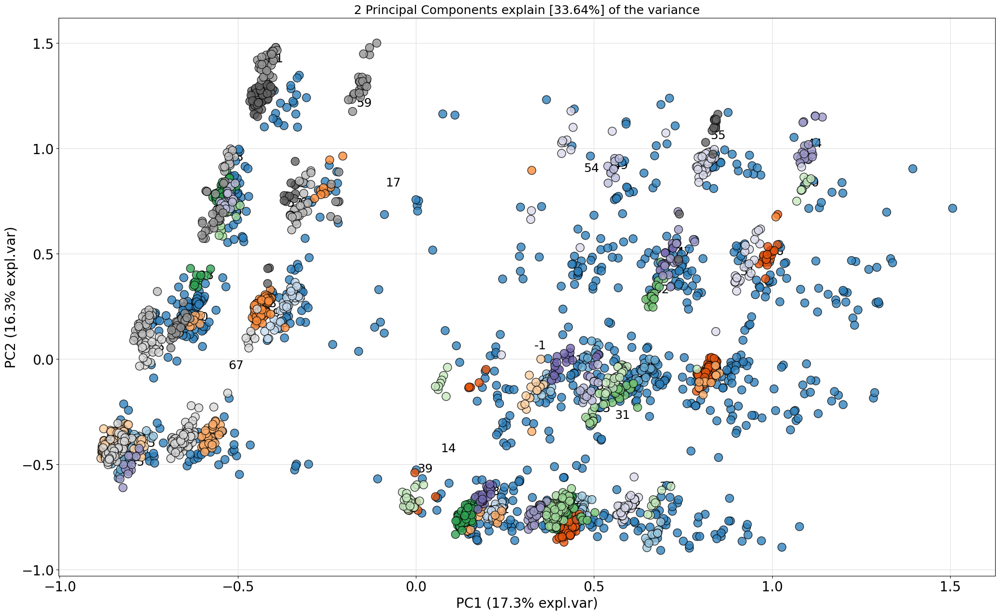

[scatterd] >WARNING> posx and posy should be finite values
[scatterd] >WARNING> posx and posy should be finite values


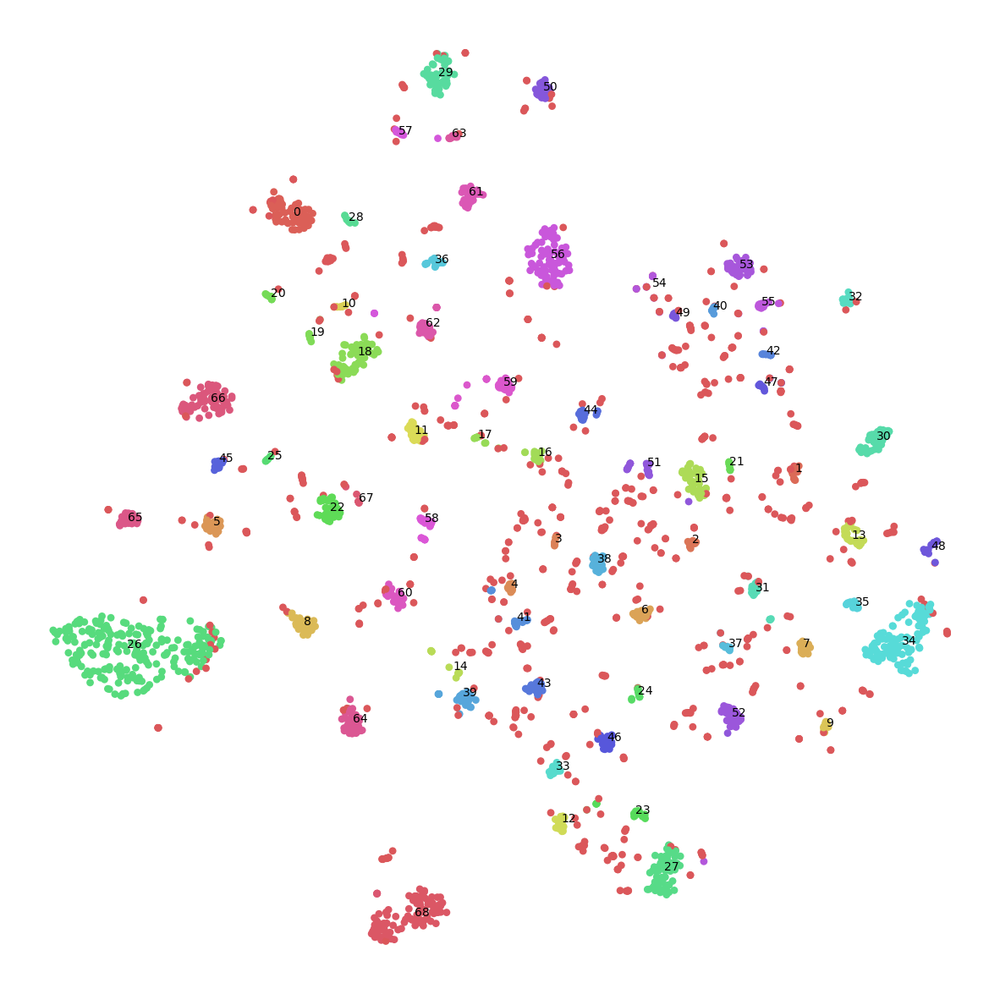

In [13]:
for fun in dim_red_funs:
    fun(HDB_X,y)

In [14]:
HDB_df = df.copy()
HDB_df["cluster"] = y

print(f'number of films: {len(HDB_df)}')
HDB_df['cluster'].value_counts()

number of films: 2783


-1     757
 26    227
 34    102
 68     93
 56     79
      ... 
 21     10
 49     10
 25     10
 10     10
 40     10
Name: cluster, Length: 70, dtype: int64

In [15]:
tmp1 = HDB_df.copy()
tmp1['colour'] = tmp1['cluster'].apply(assign_color)

tmp1 = tmp1.sort_values(by = "cluster")

html1 = tmp1.style.apply(lambda row: ['background-color: ' + row['colour']] * len(row), axis=1).to_html()
with open('HDBSCAN.html', 'w') as f:
    f.write(html1)

# OPTICS

In [25]:
OP_transformer = make_pipeline(get_features_transformer(PowerTransformer(method="box-cox"),
                                          PowerTransformer(method="box-cox"),
                                          IdentityTransformer(),
                                          IdentityTransformer()), MinMaxScaler())

OP_X = OP_transformer.fit_transform(df)


In [26]:
model = OPTICS()

parameters = {
    "min_samples": poisson(5),  # [Float | Int]
    "max_eps": [0,5,10,50,np.inf],  # [Float]
    "metric": ["minkowski", 'rogerstanimoto',  'cosine', 'euclidean', 'hamming', 'jaccard'],  # [str | callable]
    "p": [1,2.0],  # [Float]
    "cluster_method": ["xi"],  # [str]
    "eps": [None],  # [Float | None]
    "xi":  uniform(0,1),  # [Float]
    "min_cluster_size": [None],  # [Float | Int | None]
    "algorithm": ["auto", "ball_tree", "kd_tree", "brute"],  # [Literal['auto', 'ball_tree', 'kd_tree', 'brute']]
    "leaf_size": poisson(30)  # [Int]
}

score = {
    "silhouette_score": silhouette,
    "calinski_harabasz_score": calinski_harabasz,
    "davies_bouldin_score": davies_bouldin}

In [27]:
tester = RandomizedSearchCV(estimator=model,
                            param_distributions= parameters,
                            random_state=14, 
                            scoring=score,
                            refit='silhouette_score',
                            n_iter=30,
                            cv=2) 

In [28]:
random_result = tester.fit(OP_X)
print("Best: %f using %s" % (random_result.best_score_, random_result.best_params_))

Best: 0.297447 using {'algorithm': 'brute', 'cluster_method': 'xi', 'eps': None, 'leaf_size': 26, 'max_eps': 10, 'metric': 'rogerstanimoto', 'min_cluster_size': None, 'min_samples': 3, 'p': 2.0, 'xi': 0.011564627754315993}


In [29]:
model = random_result.best_estimator_
y = model.fit_predict(OP_X)
labels = model.labels_
len(set(labels)) - (1 if -1 in labels else 0)

169

[scatterd] >WARNING> posx and posy should be finite values
[scatterd] >WARNING> posx and posy should be finite values


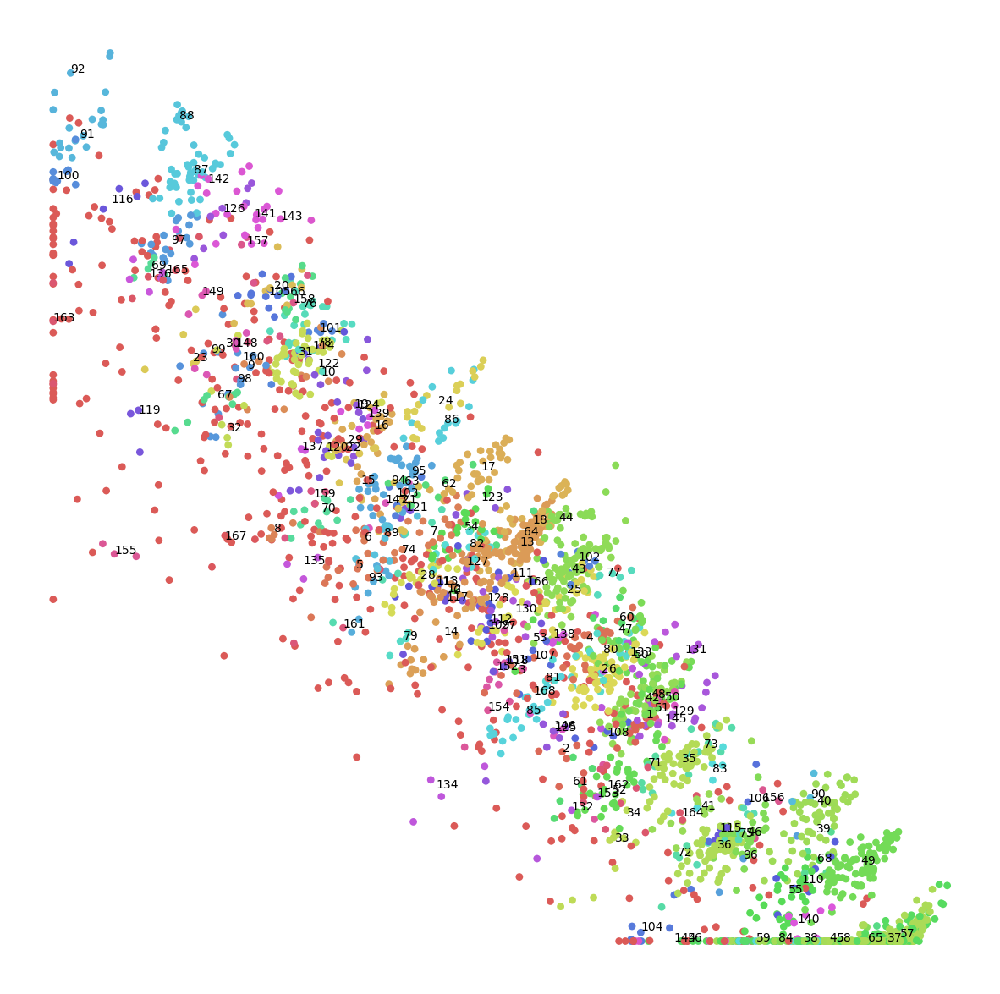

[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >The PCA reduction is performed on the [19] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


[scatterd] >INFO> Create scatterplot


[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


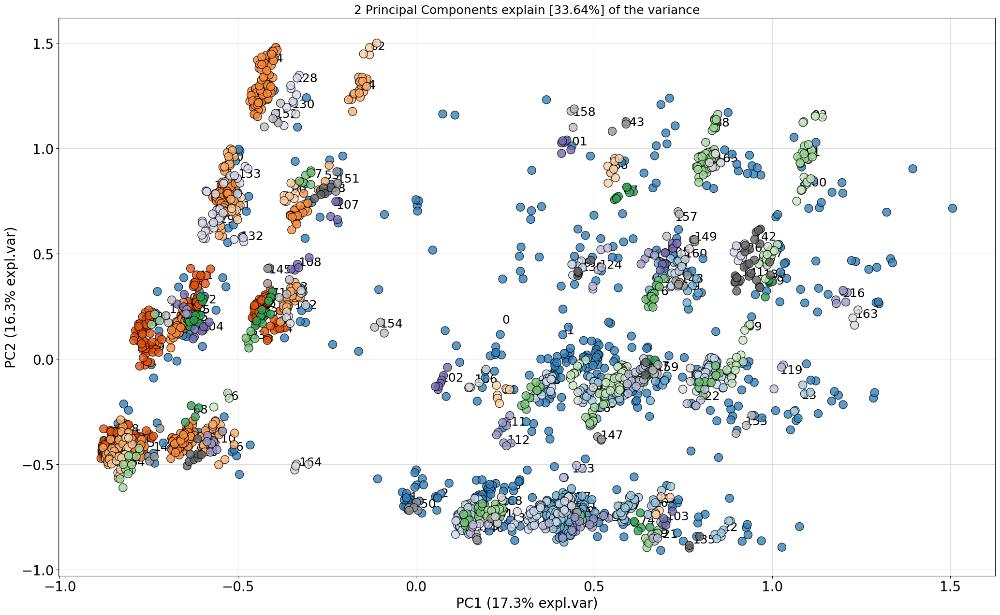

[scatterd] >WARNING> posx and posy should be finite values
[scatterd] >WARNING> posx and posy should be finite values


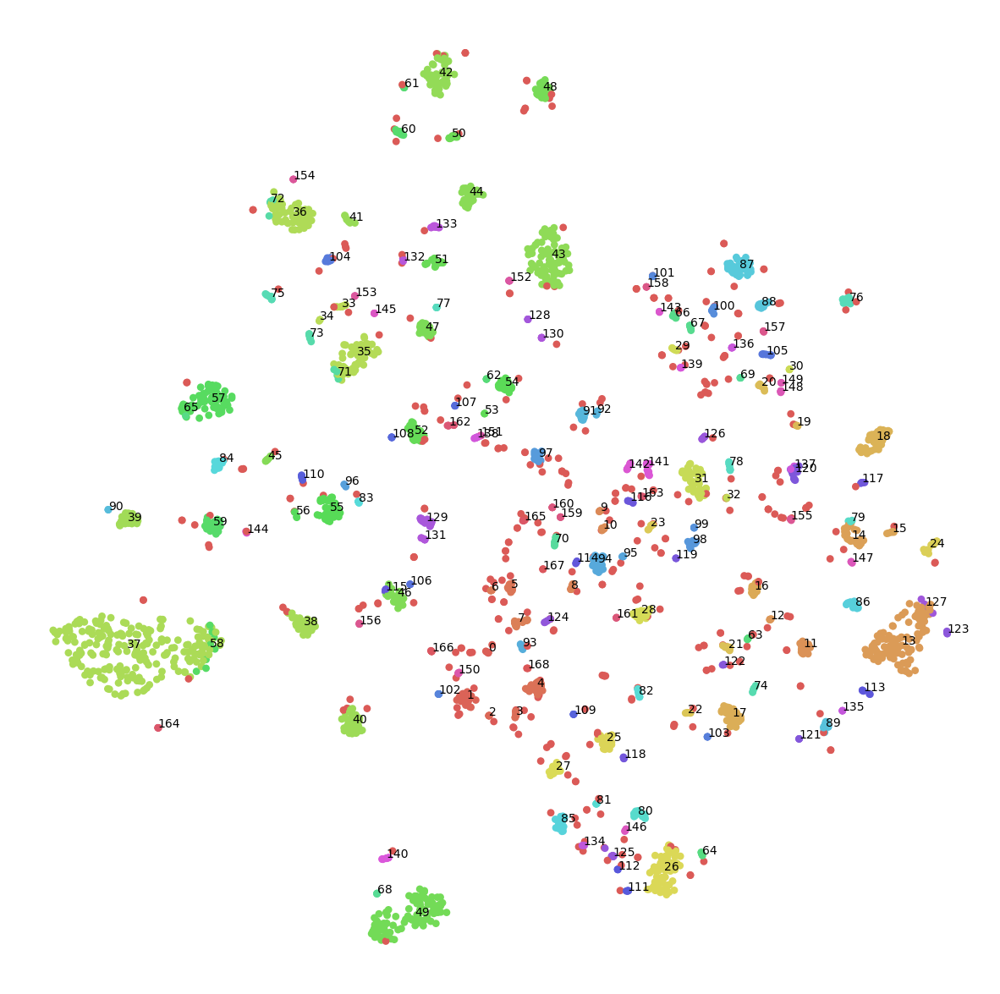

In [69]:
for fun in dim_red_funs:
    fun(OP_X,y)

In [30]:
OP_df = df.copy()
OP_df["cluster"] = y

print(f'number of films: {len(OP_df)}')
OP_df['cluster'].value_counts()

number of films: 2783


-1      380
 37     227
 13     102
 49      93
 43      79
       ... 
 106      3
 135      3
 132      3
 119      3
 168      3
Name: cluster, Length: 170, dtype: int64

In [31]:
tmp1 = OP_df.copy()
tmp1['colour'] = tmp1['cluster'].apply(assign_color)

tmp1 = tmp1.sort_values(by = "cluster")

html1 = tmp1.style.apply(lambda row: ['background-color: ' + row['colour']] * len(row), axis=1).to_html()
with open('OPTICS.html', 'w') as f:
    f.write(html1)

# Spectral Clustering

In [73]:
SC_transformer = make_pipeline(get_features_transformer(PowerTransformer(method="box-cox"),
                                          PowerTransformer(method="box-cox"),
                                          StandardScaler(),
                                          StandardScaler()), MinMaxScaler())

SC_X = SC_transformer.fit_transform(df)

In [75]:
def count_wcss_scores(X, k_max, fun):
    scores = []
    for k in range(2, k_max+1):
        model = SpectralClustering(n_clusters=k, assign_labels='discretize', random_state=0)
        labels = model.fit_predict(X)
        wcss = fun(X, labels= labels)
        scores.append(wcss)
    return scores

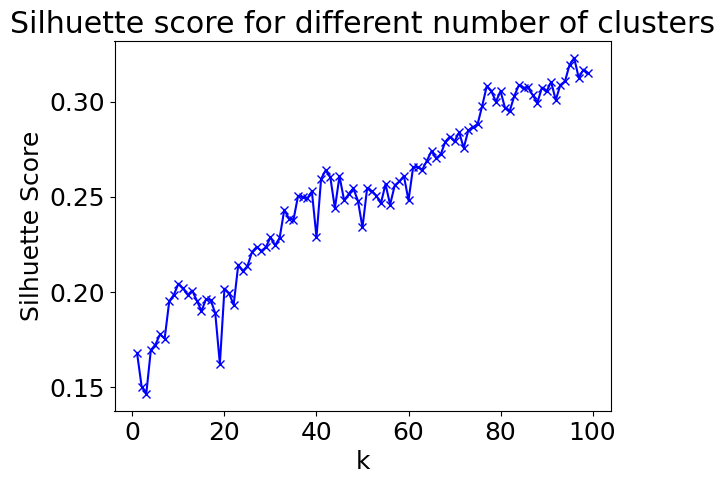

In [76]:
wcss_vec = count_wcss_scores(SC_X, 100, silhouette_score)
x_ticks = list(range(1, len(wcss_vec) + 1))
plt.plot(x_ticks, wcss_vec, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhuette Score')
plt.title('Silhuette score for different number of clusters')
plt.show()

In [77]:
model = SpectralClustering()

parameters = {
    "n_clusters": poisson(22), 
    "eigen_solver": ['arpack', 'lobpcg'], 
    "n_components": [None, 14],  # 14 is form PCA decomposition
    "random_state": [420], 
    "n_init": [10],  
    "gamma": [1.0],  
    "affinity": ["rbf", "nearest_neighbors"],
    "n_neighbors": [10,38], 
    "eigen_tol": ["auto"], 
    "assign_labels": ["kmeans", "discretize", "cluster_qr"], 
    "degree":[3.0] 
}


score = {
    "silhouette_score": silhouette,
    #"calinski_harabasz_score": calinski_harabasz,
    "min_distance": min_distance_between_clusters}

In [78]:
tester = RandomizedSearchCV(estimator=model,
                            param_distributions= parameters,
                            random_state=14, 
                            scoring=score,
                            refit='silhouette_score',
                            n_iter=30,
                            cv=2) 

In [79]:
random_result = tester.fit(SC_X)
print("Best: %f using %s" % (random_result.best_score_, random_result.best_params_))

Best: 0.223726 using {'affinity': 'nearest_neighbors', 'assign_labels': 'kmeans', 'degree': 3.0, 'eigen_solver': 'lobpcg', 'eigen_tol': 'auto', 'gamma': 1.0, 'n_clusters': 38, 'n_components': 14, 'n_init': 10, 'n_neighbors': 10, 'random_state': 420}


In [80]:
model = random_result.best_estimator_
y = model.fit_predict(SC_X)
labels = model.labels_

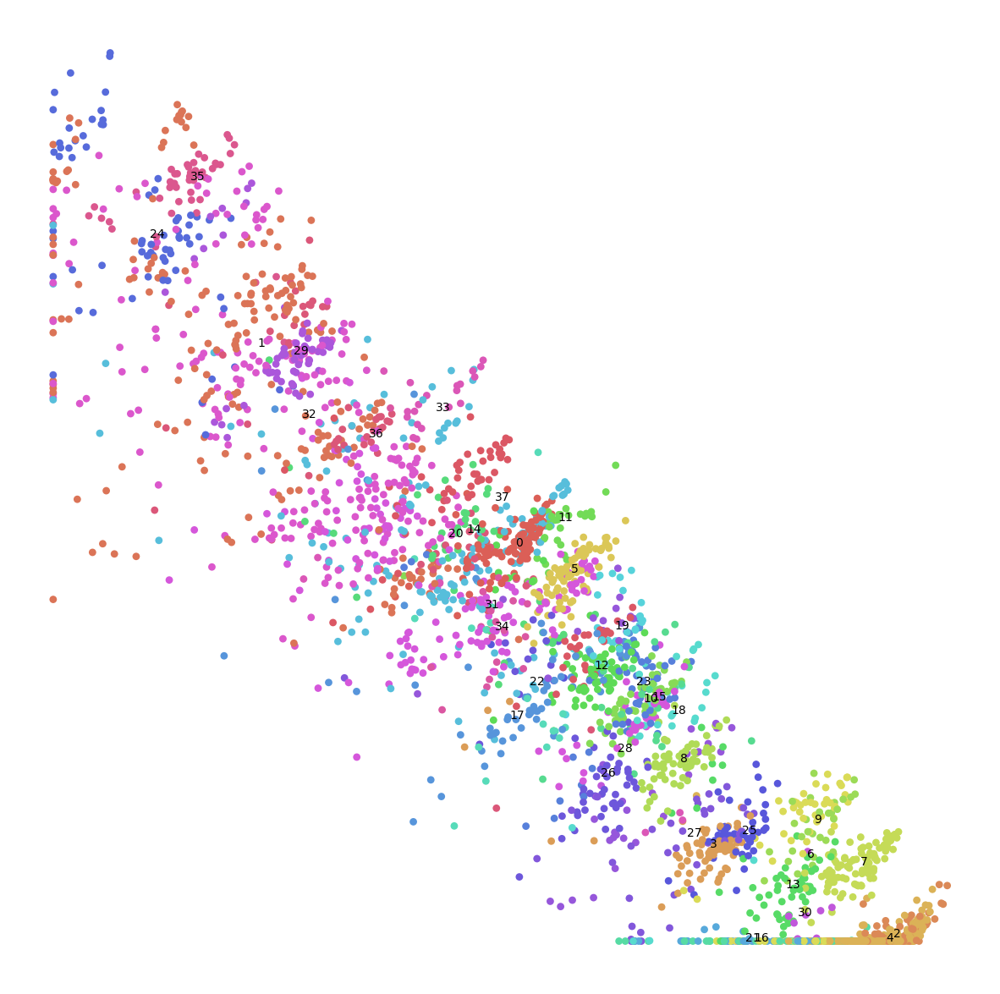

[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >The PCA reduction is performed on the [19] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


[scatterd] >INFO> Create scatterplot


[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


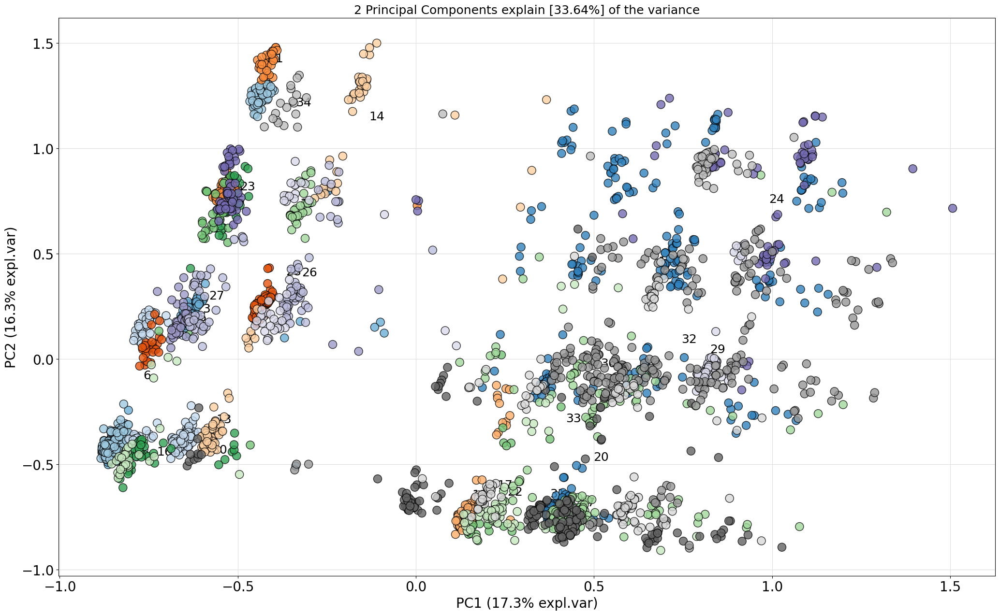

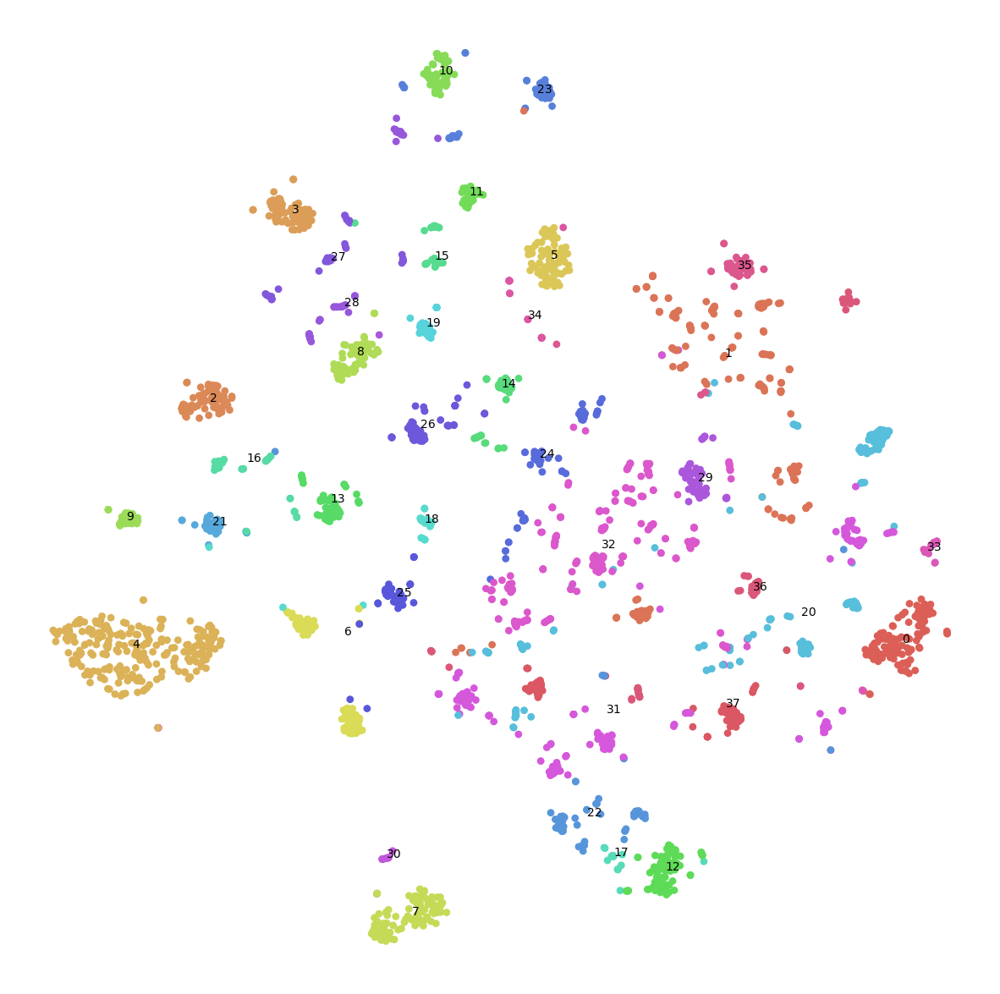

In [81]:
for fun in dim_red_funs:
    fun(SC_X,y)

In [82]:
SC_df = df.copy()
SC_df["cluster"] = y

print(f'number of films: {len(SC_df)}')
SC_df['cluster'].value_counts()

number of films: 2783


32    245
4     239
1     222
31    186
20    159
0     113
7      97
5      81
12     79
6      78
37     75
22     73
24     72
2      68
3      66
36     66
8      66
29     62
13     58
26     56
23     54
10     54
35     49
14     45
25     45
28     43
27     42
16     36
11     32
21     32
19     30
18     29
9      29
33     28
15     26
34     19
17     18
30     11
Name: cluster, dtype: int64

In [84]:
tmp1 = SC_df.copy()
tmp1['colour'] = tmp1['cluster'].apply(assign_color)

tmp1 = tmp1.sort_values(by = "cluster")

html1 = tmp1.style.apply(lambda row: ['background-color: ' + row['colour']] * len(row), axis=1).to_html()
with open('SpectralClustering.html', 'w') as f:
    f.write(html1)

# Gaussian Mixture

In [85]:
GM_transformer = make_pipeline(get_features_transformer(PowerTransformer(method="box-cox"),
                                          PowerTransformer(method="box-cox"),
                                          StandardScaler(),
                                          StandardScaler()), MinMaxScaler())

GM_X = GM_transformer.fit_transform(df)

In [86]:
model =  GaussianMixture()

parameters = {
    "n_components": poisson(21), 
    "covariance_type": ["full", "tied", "diag", "spherical"],  # [Literal['full', 'tied', 'diag', 'spherical']]
    "max_iter": [100],  # [Int]
    "n_init": [3],  # [Int]
    "init_params": ["kmeans", "k-means++", "random", "random_from_data"],  # [Literal['kmeans', 'k-means++', 'random', 'random_from_data']]
    "random_state": [420],  # [Int | RandomState | None]
}

score = {
    "silhouette_score": silhouette,
    #"calinski_harabasz_score": calinski_harabasz,
    "min_distance": min_distance_between_clusters}

In [87]:
tester = RandomizedSearchCV(estimator=model,
                            param_distributions= parameters,
                            random_state=14, 
                            scoring=score,
                            refit='silhouette_score',
                            n_iter=30,
                            cv=2) 

In [88]:
random_result = tester.fit(GM_X)
print("Best: %f using %s" % (random_result.best_score_, random_result.best_params_))

Best: 0.209289 using {'covariance_type': 'diag', 'init_params': 'kmeans', 'max_iter': 100, 'n_components': 22, 'n_init': 3, 'random_state': 420}


In [89]:
model = random_result.best_estimator_
y = model.fit_predict(GM_X)

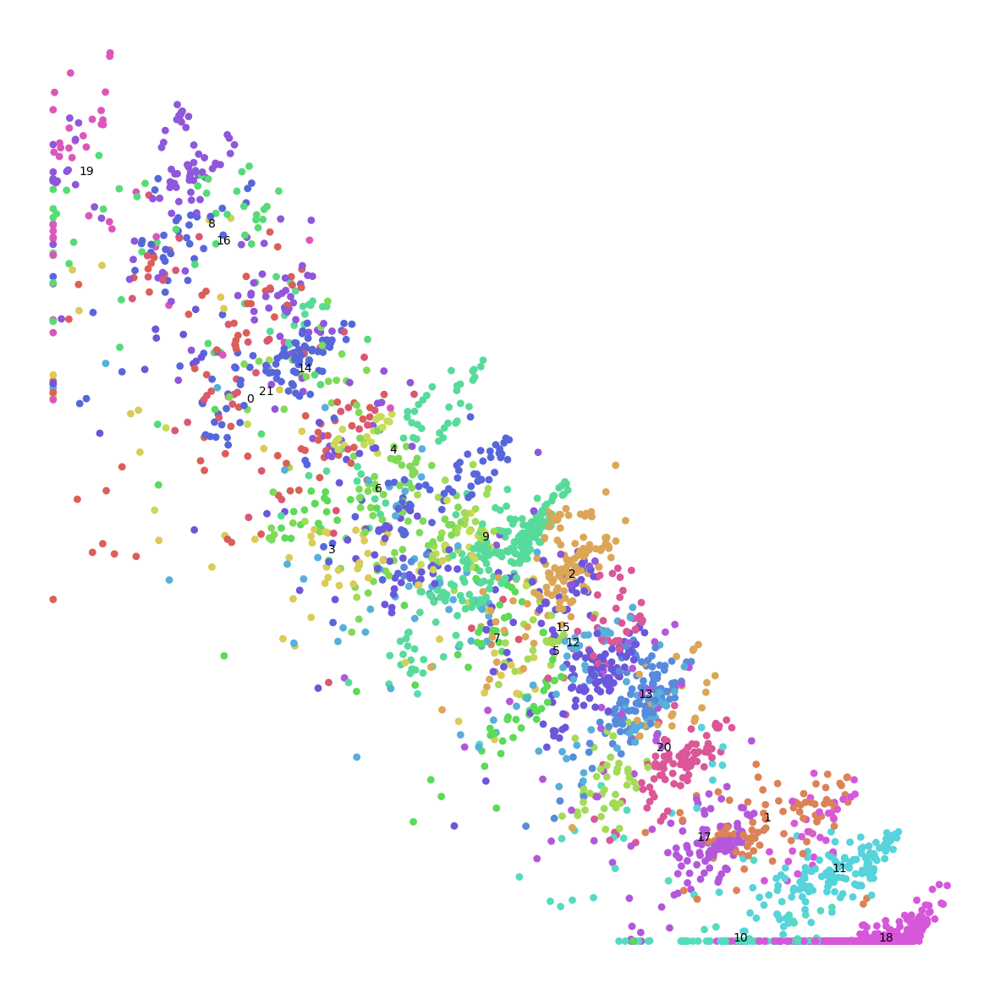

[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >The PCA reduction is performed on the [19] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


[scatterd] >INFO> Create scatterplot


[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


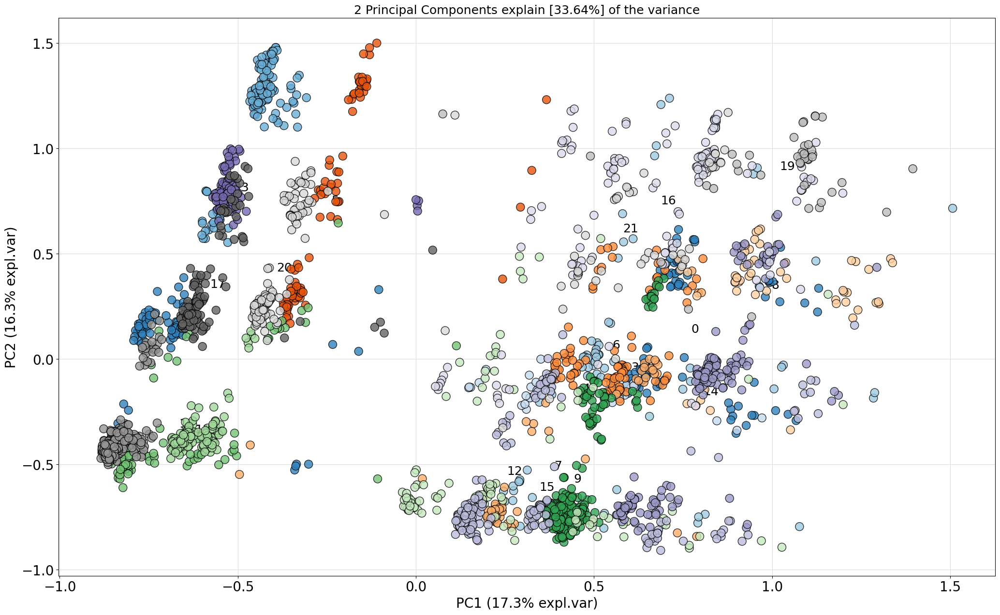

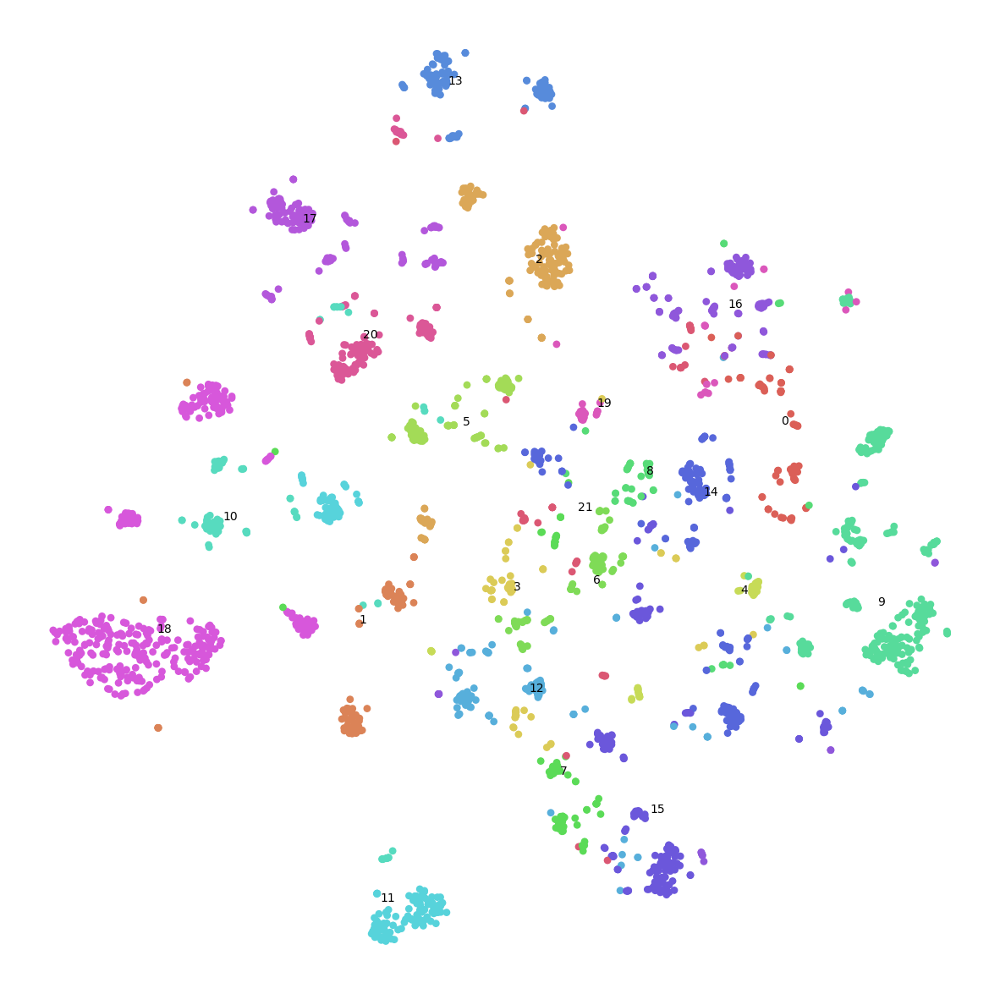

In [90]:
for fun in dim_red_funs:
    fun(GM_X,y)

In [91]:
GM_df = df.copy()
GM_df["cluster"] = y

print(f'number of films: {len(GM_df)}')
GM_df['cluster'].value_counts()

number of films: 2783


18    377
9     276
15    200
14    186
2     157
11    156
16    149
17    134
20    130
12    122
13    108
6      97
5      96
1      93
7      85
10     85
0      81
3      65
8      53
21     48
4      43
19     42
Name: cluster, dtype: int64

In [92]:
tmp1 = GM_df.copy()
tmp1['colour'] = tmp1['cluster'].apply(assign_color)

tmp1 = tmp1.sort_values(by = "cluster")

html1 = tmp1.style.apply(lambda row: ['background-color: ' + row['colour']] * len(row), axis=1).to_html()
with open('GaussianMixture.html', 'w') as f:
    f.write(html1)

In [93]:
best_params = {'covariance_type': 'diag', 'init_params': 'kmeans', 'max_iter': 100, 'n_components': 22, 'n_init': 3, 'random_state': 420}

In [94]:
def count_wcss_scores(X, k_max, fun):
    scores = []
    for k in range(2, k_max+1):
        best_params = {'covariance_type': 'diag', 'init_params': 'kmeans', 'max_iter': 100, 'n_components': k, 'n_init': 3, 'random_state': 420}
        model = GaussianMixture(**best_params)
        labels = model.fit_predict(X)
        wcss = fun(X, labels= labels)
        scores.append(wcss)
    return scores

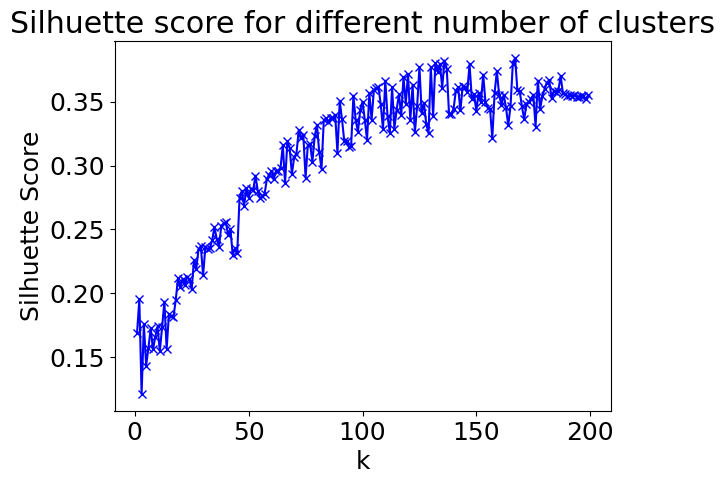

In [95]:
wcss_vec = count_wcss_scores(GM_X, 200, silhouette_score)
x_ticks = list(range(1, len(wcss_vec) + 1))
plt.plot(x_ticks, wcss_vec, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhuette Score')
plt.title('Silhuette score for different number of clusters')
plt.show()

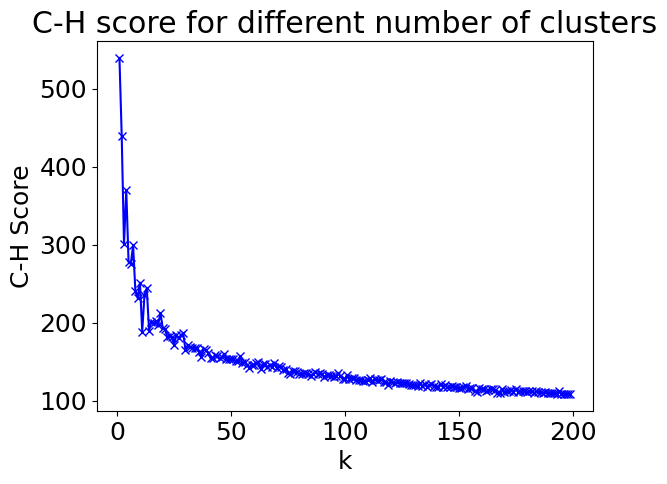

In [96]:
wcss_vec = count_wcss_scores(GM_X, 200, calinski_harabasz_score)
x_ticks = list(range(1, len(wcss_vec) + 1))
plt.plot(x_ticks, wcss_vec, 'bx-')
plt.xlabel('k')
plt.ylabel('C-H Score')
plt.title('C-H score for different number of clusters')
plt.show()

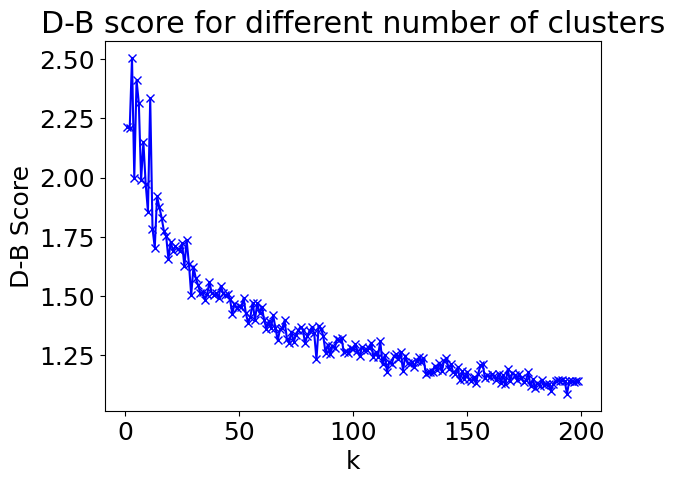

In [97]:
wcss_vec = count_wcss_scores(GM_X, 200, davies_bouldin_score)
x_ticks = list(range(1, len(wcss_vec) + 1))
plt.plot(x_ticks, wcss_vec, 'bx-')
plt.xlabel('k')
plt.ylabel('D-B Score')
plt.title('D-B score for different number of clusters')
plt.show()